In [167]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import itertools
import math
from tqdm import tqdm_notebook as tqdm
from mpl_toolkits.mplot3d import Axes3D
from joblib import Parallel, delayed

train_df = pd.read_csv('../../data/train.csv')
structure_df = pd.read_csv('../../data/structures.csv')

valence_info = pd.read_pickle('../../pkl/valence_info.pkl')
xyz_info = pd.read_pickle('../../pkl/xyz_info.pkl')
name_info = pd.read_pickle('../../pkl/name_info.pkl')
number_info = pd.read_pickle('../../pkl/number_info.pkl')
distance_info = pd.read_pickle('../../pkl/distance_info.pkl')
atom_valence = pd.read_pickle('../../pkl/atom_valence.pkl')

atom_name = structure_df['atom'].unique()
molecule_name = structure_df['molecule_name'].unique()

structure_df = pd.concat([structure_df, pd.DataFrame(atom_valence, columns=['atom_valence'])], axis=1)

In [20]:
def link_edge(edge_dict,i):
    edge_set = set()
    for n in range(len(edge_dict)):
        for idx, key in enumerate(edge_dict.keys()):
            if idx == 0 and n == 0:
                atom_idx_1 = int(key.split('-')[0])
                atom_idx_2 = int(key.split('-')[1])
                edge_set.add(atom_idx_1)
                edge_set.add(atom_idx_2)
            else:
                sub_set = set()
                atom_idx_1 = int(key.split('-')[0])
                atom_idx_2 = int(key.split('-')[1])
                sub_set.add(atom_idx_1)
                sub_set.add(atom_idx_2)
                if sub_set.issubset(edge_set):
                    skip = 0
                elif len(edge_set.intersection(sub_set)) > 0:
                    edge_set = edge_set.union(sub_set)
    
    if np.sum(list(number_info[molecule_name[i]].values()))==len(edge_set):
        # success
        return -1
    else:
        # error
        return i

def print_3Dstructure(edge_dict, name_idx, figsize=(9, 9), scale=5, plot=True, save=True):
    atom_color = {'C':'c', 'H':'r', 'N':'b', 'O':'y', 'F':'m'}
    if plot:
        %matplotlib inline
    else:
        %matplotlib agg
        
    fig = plt.figure(figsize=(16, 9))
    ax = fig.add_subplot(111, projection='3d')
    
    for key, value in xyz_info[molecule_name[name_idx]].items():
        x = value['x']
        y = value['y']
        z = value['z']
        ax.scatter(x, y, z, color=atom_color[name_info[molecule_name[name_idx]][key]], s=50)

        ax.set_xlim(-scale, scale)
        ax.set_ylim(-scale, scale)
        ax.set_zlim(-scale, scale)
        
        handles=[ax.scatter([], [], [], color=c, s=50) for c in atom_color.values()]
        ax.legend(handles=handles, labels=atom_color.keys())

    for key, value in edge_dict.items():
        s = int(key.split('-')[0])
        e = int(key.split('-')[1])
        xs = xyz_info[molecule_name[name_idx]][s]['x']
        ys = xyz_info[molecule_name[name_idx]][s]['y']
        zs = xyz_info[molecule_name[name_idx]][s]['z']
        xe = xyz_info[molecule_name[name_idx]][e]['x']
        ye = xyz_info[molecule_name[name_idx]][e]['y']
        ze = xyz_info[molecule_name[name_idx]][e]['z']
        
        plt.plot([xs,xe],[ys,ye],[zs,ze], color='black', alpha=0.3)

#     if save:
#         plt.savefig(os.path.join(save_folder, filename))
    
    if plot:
        plt.show()

In [193]:
def idx_run(name_idx):
    edge_dict, edge_combination, error = edge(name_idx)
    print(edge_dict)
    print(edge_combination)
    print(error)

def run(all = True, num=None):
    sf_error = list()
    ss_error = list()
    bf_error = list()
    bf_success = list()
    if all:
        test_num = len(molecule_name)
    else:
        test_num = num
    for i in tqdm(range(test_num)):
        edge_dict, edge_combination, error = edge(i)
        if error == 1:
            sf_error.append(i)
        elif error == 2:
            ss_error.append(i)
        elif error == 3:
            bf_error.append(i)
        elif error == 5:
            bf_success.append(i)
    return sf_error, ss_error, bf_error, bf_success

In [231]:
def edge(name_idx):

    error = 0
    count = 0
    rm_list = list()
    edge_num_info = dict()
    edge_dict = dict()
    edge_combination = dict()
    sub_distance_info = dict()
    edge_num_info_args = dict()
    edge_dict_args = dict()
    distance_info_args = dict()

    # distance_info need
    for key,value in distance_info[molecule_name[name_idx]].items():
        sub_distance_info[key] = value

    for key,value in name_info[molecule_name[name_idx]].items():
        edge_num_info[key] = valence_info[value]

    # first step
    while True:
        one_edge_list = list()
        for key,value in edge_num_info.items():
            if value == 1:
                one_edge_list.append(key)

        if len(one_edge_list) == 0:
            break  
        
        for atom_idx_1 in one_edge_list:
            for key,value in sorted(sub_distance_info.items(), key=lambda x:x[1]):
                c_1 = False
                c_2 = False
                c_3 = False
                c_4 = False
                atom = key.split('-')

                if str(atom_idx_1) == atom[0]:
                    atom_idx_2 = int(atom[1])
                    c_1 = True
                elif str(atom_idx_1) == atom[1]:
                    atom_idx_2 = int(atom[0])
                    c_1 = True

                if c_1 and (edge_num_info[atom_idx_1] > 0) and (edge_num_info[atom_idx_2] > 0):
                    c_2 = True

                if c_2 and name_info[molecule_name[name_idx]][atom_idx_2] != 'H' and name_info[molecule_name[name_idx]][atom_idx_2] != 'F':
                    c_3 = True

                if c_3 and (key not in edge_dict):
                    c_4 = True

                if c_4:
                    edge_dict[key] = value
                    edge_num_info[atom_idx_1] -= 1
                    edge_num_info[atom_idx_2] -= 1
    
    for key, value in sub_distance_info.items():
        atom = key.split('-')
        atom_idx_1 = int(atom[0])
        atom_idx_2 = int(atom[1])
        if (edge_num_info[atom_idx_1] == 0) or (edge_num_info[atom_idx_2] == 0):
            rm_list.append(key)
    for r in rm_list:
        del sub_distance_info[r]
    
    if len(sub_distance_info) == 0:
        for key in edge_dict.keys():
            edge_combination[key] = 1
        return edge_dict,edge_combination, error
    
    # argments of edge_bf()
    edge_num_info_args = edge_num_info.copy()
    edge_dict_args = edge_dict.copy()
    dict_mean = np.mean(list(sub_distance_info.values()))
    for key, value in sorted(sub_distance_info.items(), key=lambda x:x[1]):
        if value < dict_mean:
            distance_info_args[key] = value
    #

    # second step
    # all vertex are reachable
    
    flag = False
    sub_edge_num_info = dict()
    for key, value in edge_num_info.items():
        if value != 0:
            sub_edge_num_info[key] = value

    for key, value in sorted(sub_distance_info.items(), key=lambda x:x[1]):
        c_1 = False
        c_2 = False
        c_3 = False
        atom = key.split('-')

        atom_idx_1 = int(atom[0])
        atom_idx_2 = int(atom[1])

        if atom_idx_1 in list(sub_edge_num_info.keys()) and atom_idx_2 in list(sub_edge_num_info.keys()):
            c_1 = True

        if c_1 and (edge_num_info[atom_idx_1] > 0) and (edge_num_info[atom_idx_2] > 0):
            c_2 = True

        if c_2 and (key not in edge_dict):
            c_3 = True

        if c_3:
            edge_dict[key] = value
            edge_num_info[atom_idx_1] -= 1
            edge_num_info[atom_idx_2] -= 1

        if link_edge(edge_dict,name_idx) == -1:
            flag = True
            break

    for key in edge_dict.keys():
        edge_combination[key] = 1
    
    if not flag:
        error = 1
        return edge_dict,edge_combination, error


    # second step
    # all vertex are used
    
    while np.sum(list(edge_num_info.values())) != 0:
        flag = False
        sub_edge_num_info = dict()
        for key, value in edge_num_info.items():
            if value != 0:
                sub_edge_num_info[key] = value
        
        if len(sub_edge_num_info) == 1:
            error = 2
            break

        for key, value in sorted(sub_distance_info.items(), key=lambda x:x[1]):
            c_1 = False
            c_2 = False
            c_3 = False
            atom = key.split('-')

            atom_idx_1 = int(atom[0])
            atom_idx_2 = int(atom[1])

            if (atom_idx_1 in list(sub_edge_num_info.keys())) and (atom_idx_2 in list(sub_edge_num_info.keys())):
                c_1 = True

            if c_1 and (edge_num_info[atom_idx_1] > 0) and (edge_num_info[atom_idx_2] > 0):
                c_2 = True

            if c_2:
                edge_dict[key] = value
                if key in edge_combination:
                    edge_combination[key] += 1
                else:
                    edge_combination[key] = 1
                edge_num_info[atom_idx_1] -= 1
                edge_num_info[atom_idx_2] -= 1

            if np.sum(list(edge_num_info.values())) == 0:
                flag = True
                break

        if flag:
            break

    # brute-force search
    if error == 2:
# #         edge_dict, edge_combination, error =  Parallel(n_jobs=-1)([delayed(edge_bf)(name_idx, edge_dict_args, edge_num_info_args, distance_info_args, per_distance_info,i)
# #                                                 for i,per_distance_info in enumerate(itertools.permutations(sub_distance_info.items(), len(sub_distance_info)))])
        return edge_bf(name_idx, edge_dict_args, edge_num_info_args, distance_info_args, 8)
#         print(distance_info_args)
    
    return edge_dict,edge_combination, error

In [234]:
def edge_bf(name_idx, edge_dict, edge_num_info, sub_distance_info, limit_num=7):
    edge_combination = dict()
    end = False
    
    for i, per_distance_info in tqdm(enumerate(itertools.permutations(sub_distance_info.items(), len(sub_distance_info))), total=math.factorial(len(sub_distance_info)//2)):
#     for i, per_distance_info in enumerate(itertools.permutations(sub_distance_info.items(), len(sub_distance_info))):
        if i > math.factorial(limit_num):
            error = 3
            break
        error = 0
        skip = False
        
        
        # second step
        # all vertex are reachable
        
        flag = False
        sub_edge_num_info = dict()
        for key, value in edge_num_info.items():
            if value != 0:
                sub_edge_num_info[key] = value

        for key, value in reversed(per_distance_info):
            c_1 = False
            c_2 = False
            c_3 = False
            atom = key.split('-')

            atom_idx_1 = int(atom[0])
            atom_idx_2 = int(atom[1])

            if atom_idx_1 in list(sub_edge_num_info.keys()) and atom_idx_2 in list(sub_edge_num_info.keys()):
                c_1 = True

            if c_1 and (edge_num_info[atom_idx_1] > 0) and (edge_num_info[atom_idx_2] > 0):
                c_2 = True

            if c_2 and (key not in edge_dict):
                c_3 = True

            if c_3:
                edge_dict[key] = value
                edge_num_info[atom_idx_1] -= 1
                edge_num_info[atom_idx_2] -= 1

            if link_edge(edge_dict,name_idx) == -1:
                flag = True
                break

        for key in edge_dict.keys():
            edge_combination[key] = 1
        
        if not flag:
            error = 1
            skip = True

        # second step
        # all vertex are used
        
        while (np.sum(list(edge_num_info.values()))!=0) and not skip:
            flag = False
            sub_edge_num_info = dict()
            for key, value in edge_num_info.items():
                if value != 0:
                    sub_edge_num_info[key] = value

            if len(sub_edge_num_info) == 1:
                error = 2
                break

            for key, value in reversed(per_distance_info):
                c_1 = False
                c_2 = False
                c_3 = False
                atom = key.split('-')

                atom_idx_1 = int(atom[0])
                atom_idx_2 = int(atom[1])

                if (atom_idx_1 in list(sub_edge_num_info.keys())) and (atom_idx_2 in list(sub_edge_num_info.keys())):
                    c_1 = True

                if c_1 and (edge_num_info[atom_idx_1] > 0) and (edge_num_info[atom_idx_2] > 0):
                    c_2 = True

                if c_2:
                    edge_dict[key] = value
                    if key in edge_combination:
                        edge_combination[key] += 1
                    else:
                        edge_combination[key] = 1
                    edge_num_info[atom_idx_1] -= 1
                    edge_num_info[atom_idx_2] -= 1

                if np.sum(list(edge_num_info.values())) == 0:
                    flag = True
                    break

            if flag:
                break

        if error == 0:
            break

    return edge_dict,edge_combination, error

In [235]:
sf, ss, bf, bf_s = run(False, 2000)
len(sf), len(ss), len(bf), len(bf_s)

KeyboardInterrupt: 

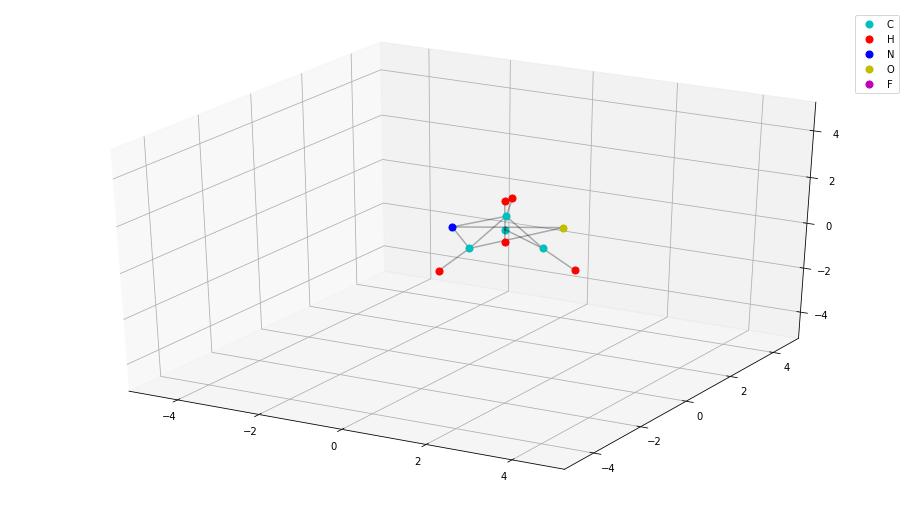

({'0-6': 1.0848875,
  '0-7': 1.084455,
  '1-8': 1.0816841,
  '3-9': 1.0828698,
  '5-10': 1.0828153,
  '4-5': 1.4469459,
  '3-5': 2.1694694,
  '3-4': 1.2718714,
  '2-5': 2.3335319,
  '2-4': 2.2692153,
  '1-3': 2.2071848,
  '0-1': 1.4995313},
 {'0-6': 1,
  '0-7': 1,
  '1-8': 1,
  '3-9': 1,
  '5-10': 1,
  '4-5': 1,
  '3-5': 1,
  '3-4': 1,
  '2-5': 1,
  '2-4': 1,
  '1-3': 1,
  '0-1': 2},
 5)

In [215]:
a,b,c = edge(654)
print_3Dstructure(a, 654)
a,b,c

In [219]:
for n in molecule_name[:2]:
    print(distance_info[n])

{'0-1': 1.0919529, '0-2': 1.0919516, '0-3': 1.0919464, '0-4': 1.0919476, '1-2': 1.7831197, '1-3': 1.7831475, '1-4': 1.7831566, '2-3': 1.7831576, '2-4': 1.7831483, '3-4': 1.7831478}
{'0-1': 1.01719, '0-2': 1.0171872, '0-3': 1.0172079, '1-2': 1.6185228, '1-3': 1.6187098, '2-3': 1.6187056}


In [218]:
structure_df[structure_df['molecule_name']==molecule_name[0]]

,molecule_name,atom_index,atom,x,y,z,atom_valence
0,dsgdb9nsd_000001,0,C,-0.012698,1.085804,0.008001,4
1,dsgdb9nsd_000001,1,H,0.002150,-0.006031,0.001976,1
2,dsgdb9nsd_000001,2,H,1.011731,1.463751,0.000277,1
3,dsgdb9nsd_000001,3,H,-0.540815,1.447527,-0.876644,1
4,dsgdb9nsd_000001,4,H,-0.523814,1.437933,0.906397,1


100%|██████████| 130775/130775 [13:14<00:00, 164.54it/s]


In [5]:
len(sf_error), len(ss_error)

(112, 2789)

In [131]:
ss_error[0]

104

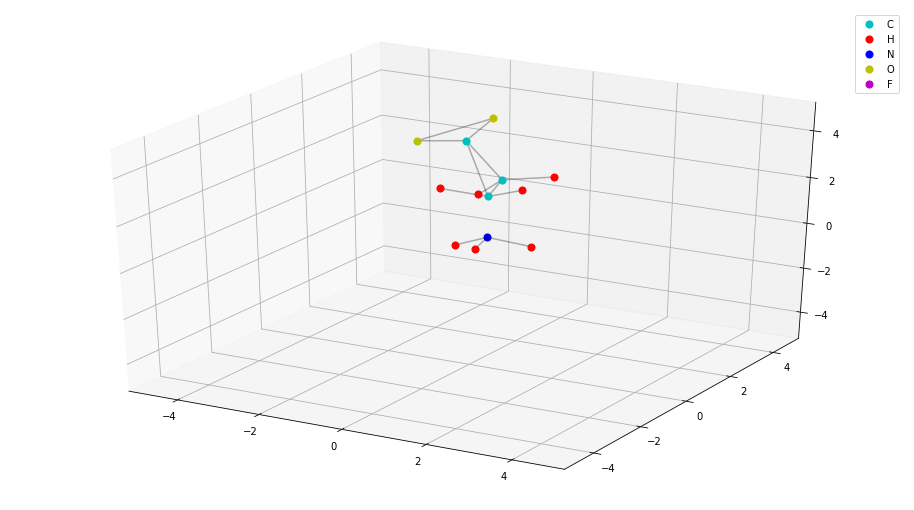

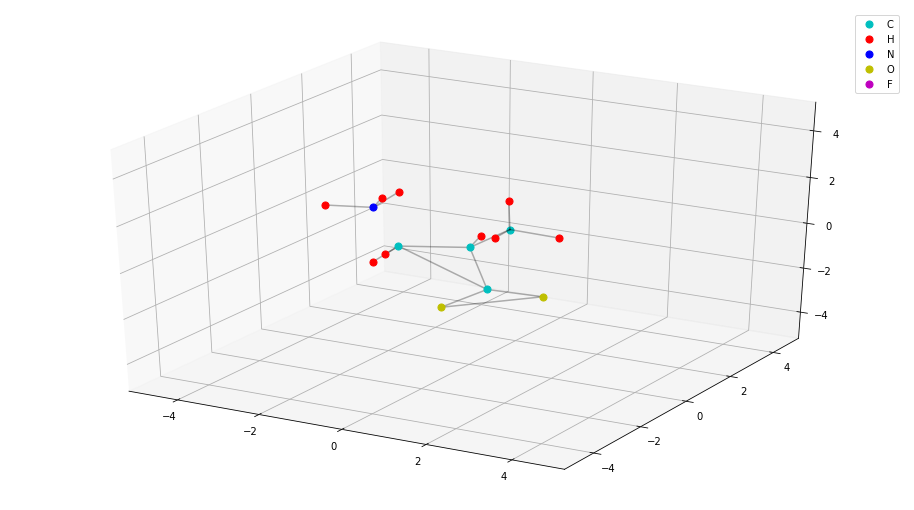

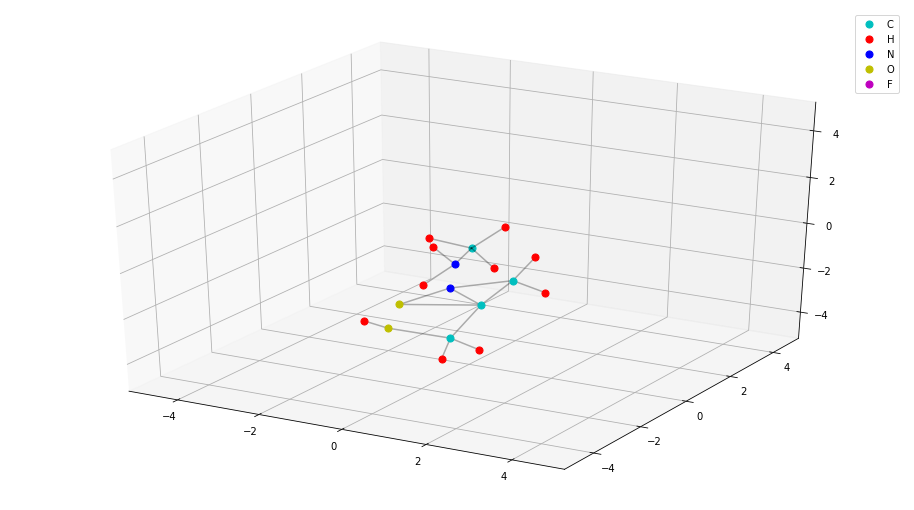

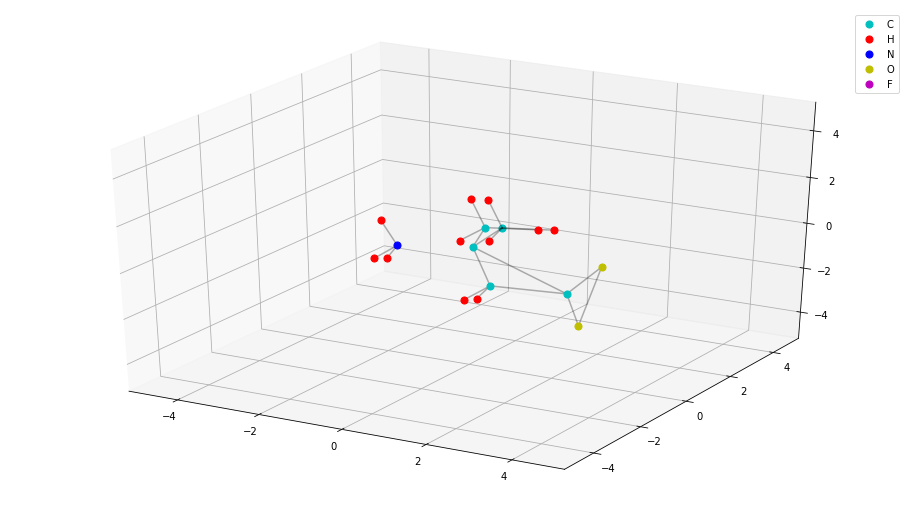

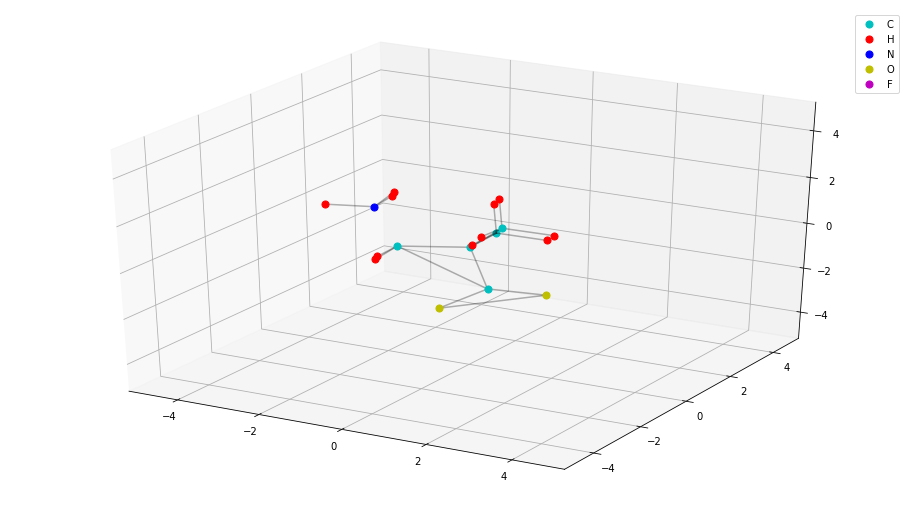

...

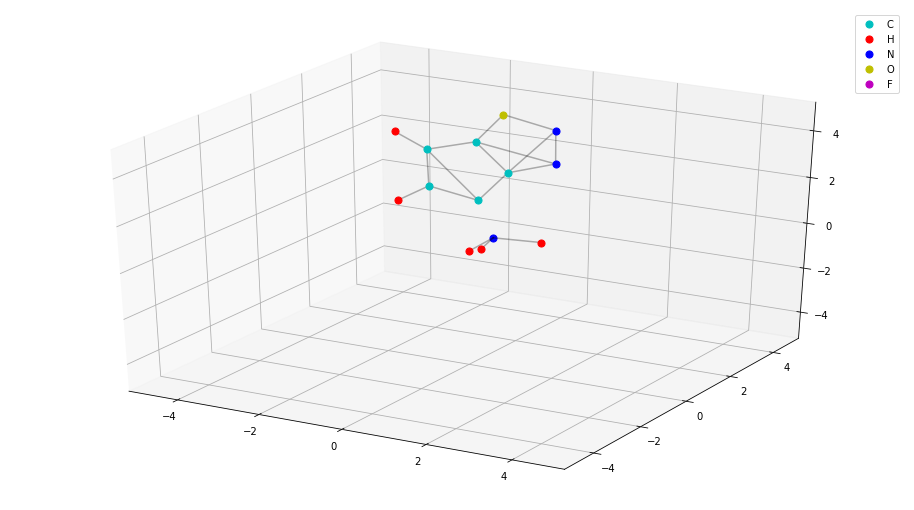

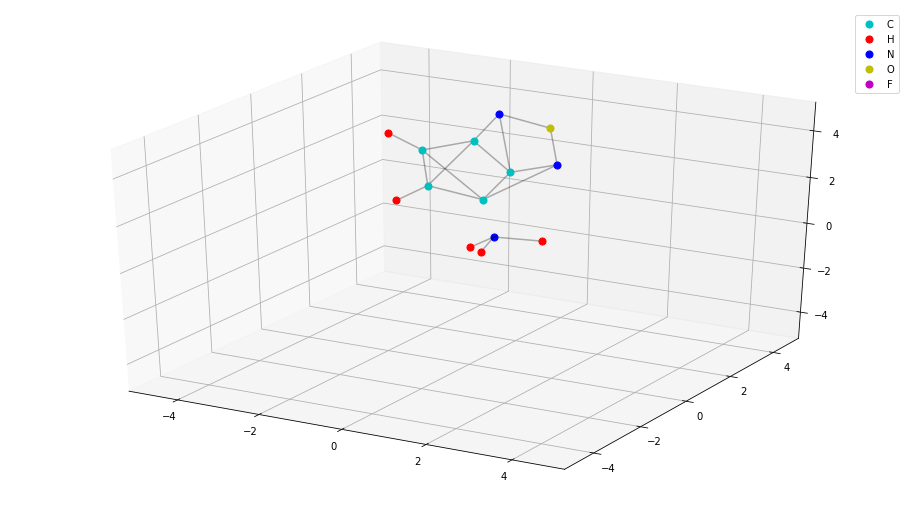

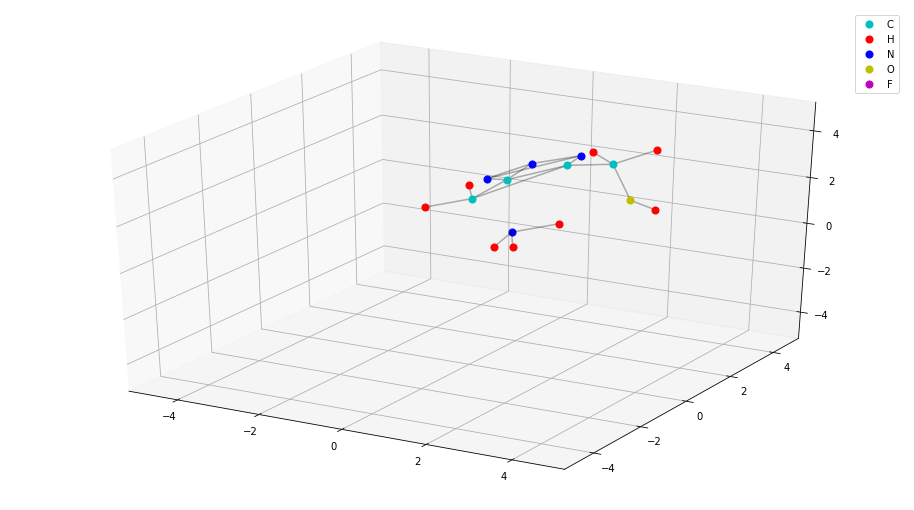

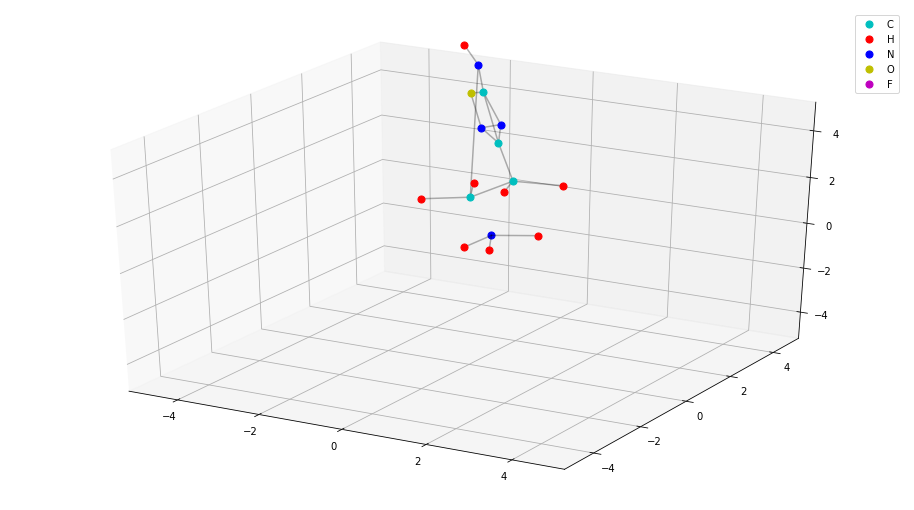

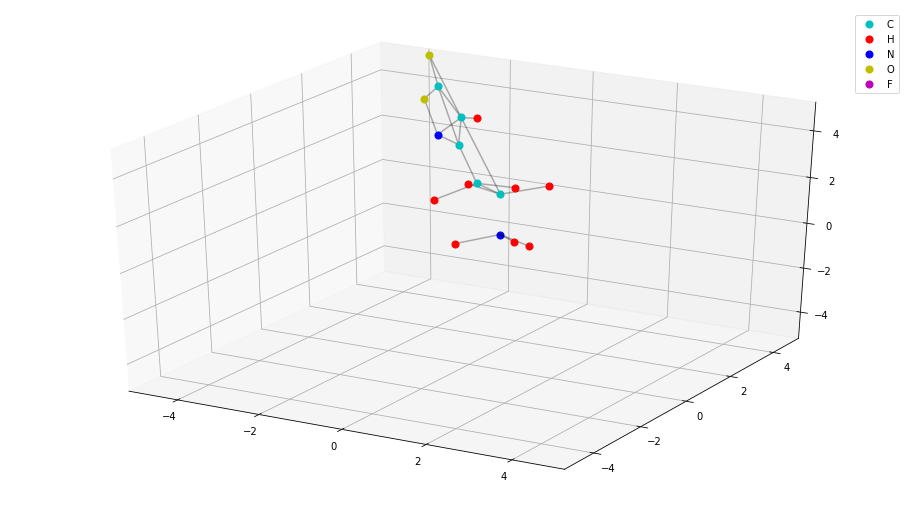

In [130]:
for sf in sf_error:
    edge_dict,edge_combination, error = edge(sf)
    print_3Dstructure(edge_dict, sf)